Copyright 2021 The TensorFlow Similarity Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [16]:
import random

In [4]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam

In [5]:
# install TF similarity if needed
try:
    import tensorflow_similarity as tfsim  # main package
except:
    !pip install tensorflow_similarity
    import tensorflow_similarity as tfsim

In [6]:
from tensorflow_similarity.utils import tf_cap_memory
from tensorflow_similarity.losses import CircleLoss # specialized similarity loss
from tensorflow_similarity.architectures import EfficientNetSim  # EfficientNet based image similarity model
from tensorflow_similarity.samplers import TFDatasetMultiShotMemorySampler  # Get and samples TF dataset catalog
from tensorflow_similarity.visualization import projector  # allows to interactively explore the samples in 2D space
from tensorflow_similarity.visualization import viz_neigbors_imgs  # Neigboors vizualisation
from tensorflow_similarity.visualization import confusion_matrix  # matching performance

In [7]:
tfsim.utils.tf_cap_memory()

## Data loading
Loading the *Oxford-IIIT pet dataset* directly from the 
[TensorFlow dataset catalog](https://www.tensorflow.org/datasets/catalog/oxford_iiit_pet).
This dataset has 37 classes has about 200 images for each classes.

In [9]:
IMG_SIZE = 300

# preprocessing function that resize images as they are from different sizes in the dataset.
def resize(img, label):
    size  = 300  # slightly larger than EfficienNetB0 size to allow random crops.
    with tf.device("/cpu:0"):

        img = tf.cast(img, dtype="int32")
        img = tf.image.resize_with_pad(img, IMG_SIZE, IMG_SIZE)
        return img, label        

Loading data directly from the TensorFlow catalog using TensorFlow similarity
`TFDatasetMultiShotMemorySampler`. Using a sampler is required to ensure that 
each batch contains at least N samples of each classes (usually 2). Otherwise 
contrastive loss cannot work properly.

As Similarity Models allow to match data from unseen classes, you can
experiment with model ability to generalize, by only trainig on a subset of 
classes. Obviously, the more classes the model see during 
training the better the performance is.

In [10]:
training_classes = 30
train_cls = range(training_classes)
classes_per_batch = min(16, training_classes)

# use the train split for training
train_ds = TFDatasetMultiShotMemorySampler('oxford_iiit_pet', 
                                           splits='train', 
                                           classes_per_batch=classes_per_batch,
                                           preprocess_fn=resize, 
                                           class_list=train_cls  # We filter train data to only keep the train classes.
                                          )

# use the test split for indexing and querying
test_ds = TFDatasetMultiShotMemorySampler('oxford_iiit_pet', 
                                          splits='test', 
                                          classes_per_batch=classes_per_batch,
                                          preprocess_fn=resize)

selecting classes: 100%|██████████| 30/30 [00:00<?, ?it/s]



Batch size is 32 (16 class X 2 example per class pre-augmentation


selecting classes: 100%|██████████| 37/37 [00:00<00:00, 74076.01it/s]



Batch size is 32 (16 class X 2 example per class pre-augmentation


indexing classes: 100%|██████████| 3669/3669 [00:00<00:00, 2449681.85it/s]


### class mapping
Dictionary that maps the class id to its name. Will be used in the vizualization.

In [28]:
breeds = {0: 'Abyssinian', 1: 'American bulldog', 2: 'American pit bull terrier', 3: 'Basset hound', 4: 'Beagle', 5: 'Bengal', 6: 'Birman', 7: 'Bombay', 8: 'Boxer', 9: 'British shorthair', 10: 'Chihuahua', 11: 'Egyptian mau', 12: 'English cocker spaniel', 13: 'English setter', 14: 'German shorthaired', 15: 'Great pyrenees', 16: 'Havanese', 17: 'Japanese chin', 18: 'Keeshond', 19: 'Leonberger', 20: 'Maine coon', 21: 'Miniature pinscher', 22: 'Newfoundland', 23: 'Persian', 24: 'Pomeranian', 25: 'Pug', 26: 'Ragdoll', 27: 'Russian blue', 28: 'Saint bernard', 29: 'Samoyed', 30: 'Scottish terrier', 31: 'Shiba inu', 32: 'Siamese', 33: 'Sphynx', 34: 'Staffordshire bull terrier', 35: 'Wheaten terrier', 36: 'Yorkshire terrier'}
species = {0: 'Dog', 1: 'Cat', 2: 'Cat', 3: 'Cat', 4: 'Cat', 5: 'Dog', 6: 'Dog', 7: 'Dog', 8: 'Cat', 9: 'Dog', 10: 'Cat', 11: 'Dog', 12: 'Cat', 13: 'Cat', 14: 'Cat', 15: 'Cat', 16: 'Cat', 17: 'Cat', 18: 'Cat', 19: 'Cat', 20: 'Dog', 21: 'Cat', 22: 'Cat', 23: 'Dog', 24: 'Cat', 25: 'Cat', 26: 'Dog', 27: 'Dog', 28: 'Cat', 29: 'Cat', 30: 'Cat', 31: 'Cat', 32: 'Dog', 33: 'Dog', 34: 'Cat', 35: 'Cat', 36: 'Cat'}

# model training

Training the model for at least 10 epochs is important to get meaningful results.

You can experiment with increasing the `embedding_size`, 
changing the lost function or tweaking the learning rate to improve 
the performance.

You can also experiment with replacing the `EfficientNetSim` model which is a 
wrapper around the EfficientNet architecture model with basic data augmentation
to increase performance further. 

In [12]:
embedding_size = 256 #@param {type:"integer"}
epochs = 10 #@param {type:"integer"}
val_steps = 10 

# building model
model = EfficientNetSim(train_ds.x[0].shape,
                        embedding_size)

# init specialized loss
gamma = 256  # Loss hyper-parameter. 256 works well here.
loss = CircleLoss(gamma=gamma)

# compiling and training
model.compile(optimizer='adam', loss=loss)
history = model.fit(train_ds,
                    epochs=epochs,
                    validation_data=test_ds,
                    validation_steps=val_steps)

Distance metric automatically set to cosine use the distance arg to override.
Epoch 1/10
1000/1000 [==============================] - 41s 33ms/step - loss: 12.4452 - val_loss: 8.4100
Warmup complete
Epoch 2/10
1000/1000 [==============================] - 31s 31ms/step - loss: 5.9275 - val_loss: 7.2759
Epoch 3/10
1000/1000 [==============================] - 31s 31ms/step - loss: 5.7380 - val_loss: 7.9621
Epoch 4/10
1000/1000 [==============================] - 31s 31ms/step - loss: 5.6732 - val_loss: 7.4040
Epoch 5/10
1000/1000 [==============================] - 31s 31ms/step - loss: 5.6172 - val_loss: 6.9539
Epoch 6/10
1000/1000 [==============================] - 31s 31ms/step - loss: 5.5836 - val_loss: 6.7159
Epoch 7/10
1000/1000 [==============================] - 31s 31ms/step - loss: 5.5014 - val_loss: 7.0615
Epoch 8/10
1000/1000 [==============================] - 31s 31ms/step - loss: 5.4526 - val_loss: 6.5883
Epoch 9/10
1000/1000 [==============================] - 29s 29ms/step - l

## Indexing
We are going to index about 1000 examples from all 37 classes to make them searchable
and use the remaining of the test dataset as unseen queries

In [13]:
# What is indexed
index_size = 1000
index_x = test_ds.x[:index_size]
index_y = test_ds.y[:index_size]
index_data = tf.cast(index_x, dtype='int32')  # casted so it can displayed

# what will be used as never seen before queries to test performance
test_x = test_ds.x[index_size:]
test_y = [int(c) for c in test_ds.y[index_size:]]
test_data = tf.cast(test_x, dtype='int32')  # casted so it can displayed


In [14]:
model.reset_index()
model.index(index_x, index_y, data=index_data)

[Indexing 1000 points]
|-Computing embeddings
|-Storing data points in index table
|-Adding embeddings to index.
|-Building index.


In [19]:
%load_ext autoreload
%autoreload 2

In [21]:
print(class_map[1])

Abyssinian


## Visualize model retrival

We are using the model `lookup()` api to query for the nearest neighboors of our
unseen query dataset and then use the `viz_neigbors_imgs` to visualize them and 
checking that the matched images are vizually similar.

Building NN list: 100%|██████████| 5/5 [00:00<00:00, 10010.27it/s]


Performing NN search



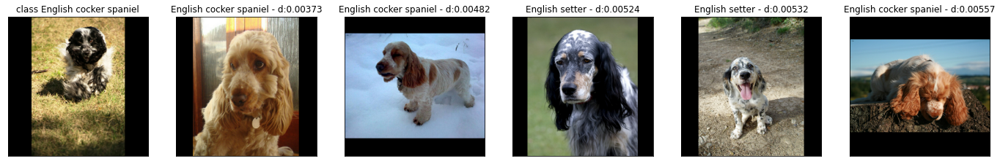

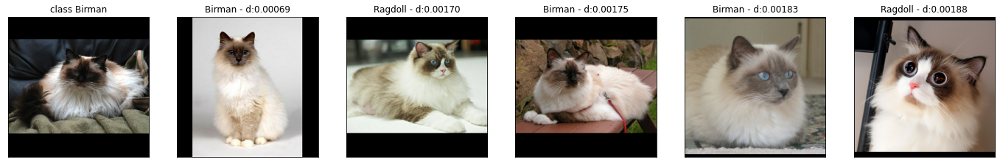

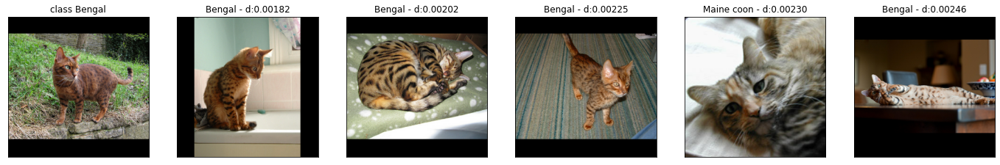

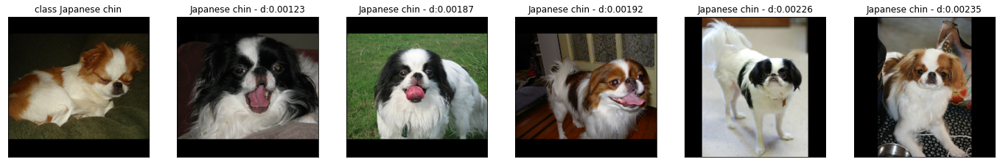

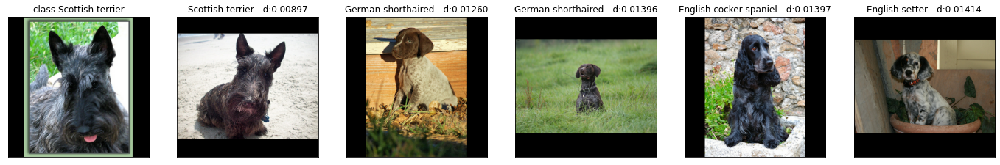

In [30]:
num_examples = 5
num_neigboors = 5
idxs = random.sample(test_y, num_examples)
batch = tf.gather(test_x, idxs)
nns = model.lookup(batch, k=num_neigboors)
for idx, nn in enumerate(nns):
    bid = idxs[idx] 
    viz_neigbors_imgs(test_data[bid], test_y[bid], nn, class_map=breeds)


## Visualize clusters

Let's project the embedding into a 2D space to see how well the model grouped similar images together.

In [37]:
index_size = 2000
image_size = 96
plot_size = 800
vx = test_ds.x[:index_size]
vy = test_ds.y[:index_size]
projector(model.predict(vx), labels=vy, images=vx, class_mapping=breeds, 
          image_size=image_size, plot_size=plot_size)

perfoming projection using UMAP


generating diplayabe images: 100%|██████████| 2000/2000 [00:01<00:00, 1365.19it/s]


Loading BokehJS ...